# Spider Movement Analysis using PCA
# Part 2: Principal Component Analysis of the Full Spider Shape

## Introduction
This notebook analyses how spiders move by looking at 3D recordings of their body positions. We use a technique called Principal Component Analysis (PCA) to break down complex spider movements into simpler, fundamental motion patterns. This helps us understand how spiders coordinate their legs and body during different behaviors.

Here we will perform a PCA on the full spider shape. The advantage of this approach is to find coordination across the entire spider. However, it will be heavily influenced by measurement error, and will have relatively low rows to columns ratio.

<img src="./images/spider_defs.png" alt="Spider" style="width: 60%;">


## Table of Contents
1. **Setup and Data Loading**
   - Import required libraries
   - Load processed spider data

2. **Principal Component Analysis**
   - Run PCA on full spider shape
   - Analyse variance explained
   - Visualise principal components

3. **Reconstruction**
   - Reconstruct spider shape using principal components
   - Compare original vs. reconstructed spider shape

4. **Experimental Analysis**
   - Compare PCA component scores under different experimental conditions


## Setup and Data Loading





In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline
%config InlineBackend.figure_format='svg'

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


from pathlib import Path

from morphing_birds import Spider3D, plot_plotly, animate_plotly, animate_plotly_compare, animate
from spiderpca import (run_PCA, plot_explained, get_score_range, reconstruct, 
                       create_scores_dataframe, plot_pc_experiment, plot_pc_histogram)

### Data Loading

We will load the processed spider data from the previous notebook.

In [2]:
marker_data = np.load(Path("../data/processed/carolina_no_pitch_marker_data.npy"))
marker_columns = np.load(Path("../data/processed/carolina_marker_columns.npy"))
carolina_info = pd.read_csv(Path("../data/processed/carolina_info.csv"))

# Check the dimensions of the data
assert marker_data.shape[1]*marker_data.shape[2] == len(marker_columns), "Number of columns in marker data and marker columns do not match"
assert marker_data.shape[0] == carolina_info.shape[0], "Number of rows in marker data and info dataframe do not match"

print(marker_data.shape)
print(str(marker_columns))

(20567, 35, 3)
['claw1_x' 'claw1_y' 'claw1_z' 'tibiametatarsus1_x' 'tibiametatarsus1_y'
 'tibiametatarsus1_z' 'patella1_x' 'patella1_y' 'patella1_z' 'coxa1_x'
 'coxa1_y' 'coxa1_z' 'claw2_x' 'claw2_y' 'claw2_z' 'tibiametatarsus2_x'
 'tibiametatarsus2_y' 'tibiametatarsus2_z' 'patella2_x' 'patella2_y'
 'patella2_z' 'coxa2_x' 'coxa2_y' 'coxa2_z' 'claw3_x' 'claw3_y' 'claw3_z'
 'tibiametatarsus3_x' 'tibiametatarsus3_y' 'tibiametatarsus3_z'
 'patella3_x' 'patella3_y' 'patella3_z' 'coxa3_x' 'coxa3_y' 'coxa3_z'
 'claw4_x' 'claw4_y' 'claw4_z' 'tibiametatarsus4_x' 'tibiametatarsus4_y'
 'tibiametatarsus4_z' 'patella4_x' 'patella4_y' 'patella4_z' 'coxa4_x'
 'coxa4_y' 'coxa4_z' 'claw5_x' 'claw5_y' 'claw5_z' 'tibiametatarsus5_x'
 'tibiametatarsus5_y' 'tibiametatarsus5_z' 'patella5_x' 'patella5_y'
 'patella5_z' 'coxa5_x' 'coxa5_y' 'coxa5_z' 'claw6_x' 'claw6_y' 'claw6_z'
 'tibiametatarsus6_x' 'tibiametatarsus6_y' 'tibiametatarsus6_z'
 'patella6_x' 'patella6_y' 'patella6_z' 'coxa6_x' 'coxa6_y' 'coxa6_z'

## Run PCA

We will now run PCA on the marker data.

- `principal_components`: The principal components of the data. These are the eigenvectors of the covariance matrix of the data.
- `scores`: The scores of the data. These are the projections of the data onto the principal components.

As we have 35 markers and 3 coordinates per marker, we expect 105 principal components. this is a high number of columns. The PCA is trying to find correlations between the markers which means measurement error will be influential.


In [3]:
principal_components, scores, pca = run_PCA(marker_data)


print(f"Number of frames: {marker_data.shape[0]}")
print(f"Number of markers: {marker_data.shape[1]}")
print(f"Principal components: {principal_components.shape}")
print(f"Scores: {scores.shape}")
print(f"Explained variance: {np.cumsum(pca.explained_variance_ratio_)}")

above_90 = np.where(np.cumsum(pca.explained_variance_ratio_) > 0.9)[0][0]
above_95 = np.where(np.cumsum(pca.explained_variance_ratio_) > 0.95)[0][0]
above_99 = np.where(np.cumsum(pca.explained_variance_ratio_) > 0.99)[0][0]
print(f"{above_90} components needed to explain 90% of the variance.")
print(f"{above_95} components needed to explain 95% of the variance.")
print(f"{above_99} components needed to explain 99% of the variance.")

Number of frames: 20567
Number of markers: 35
Principal components: (105, 105)
Scores: (20567, 105)
Explained variance: [0.17816495 0.28190331 0.38020216 0.45877299 0.52297018 0.57223894
 0.61869376 0.65760931 0.69171144 0.72355429 0.75369834 0.7824528
 0.80801767 0.82815639 0.84647191 0.86314654 0.8753745  0.88596968
 0.89520538 0.90371788 0.91073083 0.91737995 0.92354176 0.92908956
 0.93434967 0.93937468 0.94385587 0.94824296 0.95231862 0.95627991
 0.95993162 0.96325661 0.96599905 0.96844804 0.9707325  0.97275687
 0.97465583 0.97641296 0.97812616 0.97972396 0.98121488 0.98253287
 0.98376344 0.98488591 0.98593464 0.98690396 0.98783068 0.98869403
 0.98953135 0.99030175 0.99101585 0.99170393 0.99227902 0.99282593
 0.99336542 0.99385257 0.99427097 0.99468049 0.99506682 0.99544665
 0.99576966 0.99608806 0.99637133 0.99663419 0.99688133 0.99710367
 0.99731689 0.99751626 0.99770916 0.99788105 0.99803713 0.99818932
 0.99832224 0.9984537  0.99857434 0.99869182 0.99879807 0.99889823
 0.9989922

### Plot the Variance Explained

As we can tell from the cumulative sum of the explained variance, 90% of the variance is explained by 19 components, which is relatively high. This suggests it is difficult to find tight correlations across all the markers, indicative of independent motion. High marker error will also contribute to this.

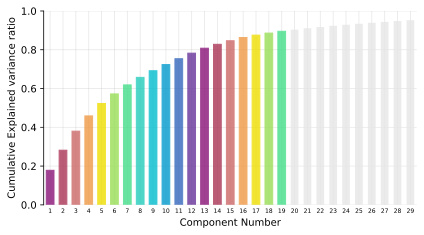

In [4]:
plt.close("all")
_ = plot_explained(pca.explained_variance_ratio_, 
                                colour_before=above_90, 
                                annotate=False,
                                xlim_max=above_95+0.5)




## Animate the Components

To understand what each component shows for the spider, we can animate the principal components by projecting each onto the average spider shape and changing the score between minimum and maximum values as found in the data. 

### Load the Average Spider

In [5]:
spider3d = Spider3D(Path("../data/mean_spider_shape_carolina.csv"))

# Optional: Plot the average spider shape
# plot_plotly(spider3d)


### Create Score Frames

Score frames will create 25 frames for each component, using a triangle wave to transition between the minimum and maximum values.

In [6]:
score_frames = get_score_range(scores, num_frames=12)
print(score_frames.shape)



(12, 105)


### Animate the Components

In [7]:

colourList = ['#817', '#a35', '#c66', 
              '#e94', '#ed0', '#9d5', 
              '#4d8', '#2cb', '#0bc',
              '#09c', '#36b', '#639']


for PC_number in [0]:
    spider3d.reset_transformation()
    spider3d.restore_keypoints_to_average()
    
    component_number = [PC_number]

    reconstructed_frames = reconstruct(score_frames, principal_components, spider3d.markers, component_number)

    print(reconstructed_frames.shape)


animate_plotly(spider3d, reconstructed_frames, colour = colourList[PC_number], score_vals=score_frames[:, PC_number])


(12, 35, 3)


## Save each component as a gif

To quickly refer to each component, we can save each component as a gif.

MovieWriter Pillow unavailable; using Pillow instead.


Figure and axes initialized.


MovieWriter Pillow unavailable; using Pillow instead.


Figure and axes initialized.


MovieWriter Pillow unavailable; using Pillow instead.


Figure and axes initialized.


MovieWriter Pillow unavailable; using Pillow instead.


Figure and axes initialized.


MovieWriter Pillow unavailable; using Pillow instead.


Figure and axes initialized.


MovieWriter Pillow unavailable; using Pillow instead.


Figure and axes initialized.


MovieWriter Pillow unavailable; using Pillow instead.


Figure and axes initialized.


MovieWriter Pillow unavailable; using Pillow instead.


Figure and axes initialized.


MovieWriter Pillow unavailable; using Pillow instead.


Figure and axes initialized.


MovieWriter Pillow unavailable; using Pillow instead.


Figure and axes initialized.


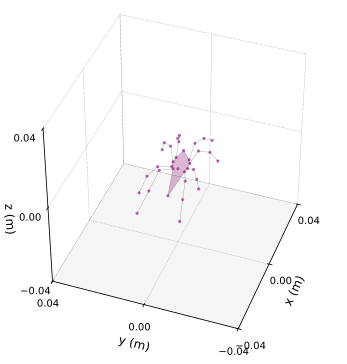

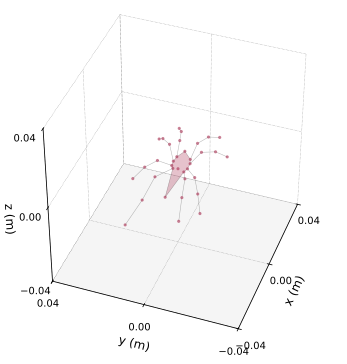

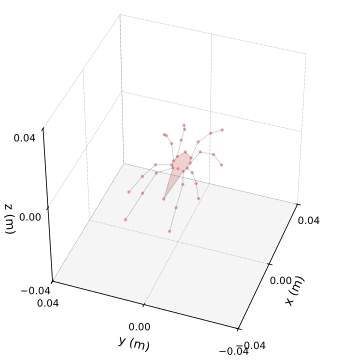

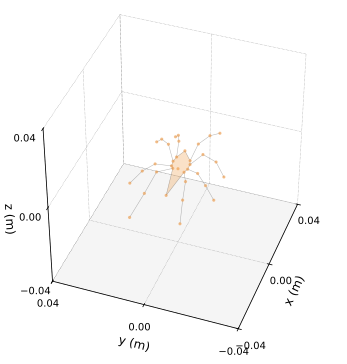

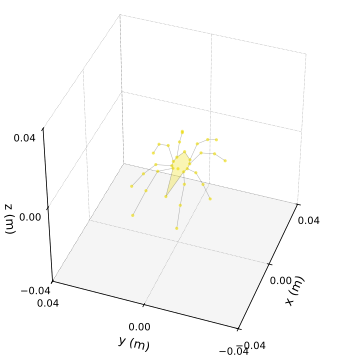

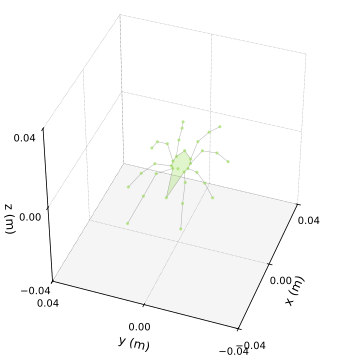

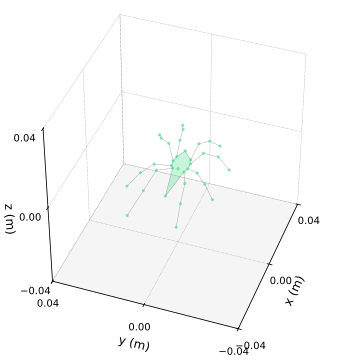

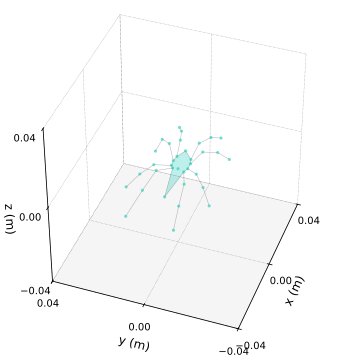

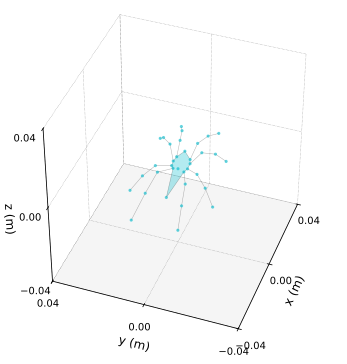

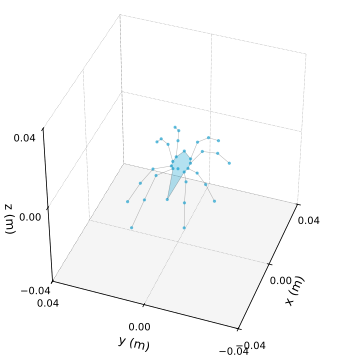

In [8]:
save_dir = Path("../results/gifs")

for ii in np.arange(0,10):
    spider3d.reset_transformation()
    spider3d.restore_keypoints_to_average()
    
    component_number = [ii]

    reconstructed_frames = reconstruct(score_frames, principal_components, spider3d.markers, component_number)

    ani = animate(spider3d, reconstructed_frames, colour=colourList[ii], alpha=0.5, az=200, el=40)        


    ani.save(save_dir / f"PC0{component_number[0]+1}.gif", writer='Pillow', fps=20, dpi=150)



In [9]:
plt.close("all")

import gc
gc.collect()


36040

## Compare Component 1 across different experimental conditions

In [10]:
scores_df = create_scores_dataframe(scores, carolina_info)

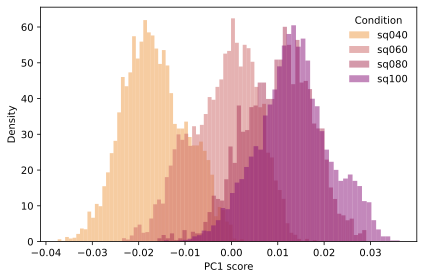

In [11]:
_ = plot_pc_experiment(scores_df, pc_number=1, conditions=["sq040", "sq060", "sq080", "sq100"])


## Plot the histogram of the scores
_ = plot_pc_histogram(scores_df, pc_number=1, conditions=["sq040", "sq060", "sq080", "sq100"])


## Reconstruct a Sequence with Reduced Components

In [12]:
# # Select a sequence by filename using the data frame
select_sequence = scores_df["sequenceID"] == "Y20230605_carolina_3_sq060_1"

# Select the scores for the sequence from the scores array
select_scores = scores[select_sequence,:]

# To view the sequence with all components:
full_components = np.arange(0,len(principal_components))
full_frames = reconstruct(select_scores, principal_components, spider3d.markers, full_components)


# To view the sequence with one component:
# component_number = [0]

# To view the sequence with first 10 components:
component_number = np.arange(0,10)
reduced_frames = reconstruct(select_scores, principal_components, spider3d.markers, component_number)

animate_plotly(spider3d, reduced_frames, colour = colourList[0])    

# Optional: Animate the full sequence on top
# animate_plotly_compare(spider3d, [full_frames, reduced_frames], colour = ["grey", "red"])
